In [ ]:
# Install required packages
!pip install xlsxwriter -q

# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
from google.colab import drive
from googleapiclient.discovery import build
from googleapiclient.http import MediaFileUpload
from google.colab import auth
from IPython.display import Image, display

# Mount Google Drive (destination account)
drive.mount('/content/drive', force_remount=True)

# File paths
gee_folder = '/content/drive/My Drive/Malawi/GEE_Folder/'
daily_file = os.path.join(gee_folder, 'ChilwaBasin_Daily_Climate_With_GEE_1981_2025.xlsx')
monthly_file = os.path.join(gee_folder, 'ChilwaBasin_Monthly_Climate_With_GEE_1981_2025.xlsx')
output_dir = '/content/Analysis_Results/'
os.makedirs(output_dir, exist_ok=True)

# Load datasets
print('Loading datasets...')
try:
    data_daily = pd.read_excel(daily_file)
    data_monthly = pd.read_excel(monthly_file)
except Exception as e:
    print(f'Error loading files: {e}')
    raise

# Convert Date columns to datetime
data_daily['Date'] = pd.to_datetime(data_daily['Date'], format='%Y-%m-%d', errors='coerce')
data_monthly['Date'] = pd.to_datetime(data_monthly['Date'], format='%Y-%m-%d', errors='coerce')

# Set Date as index
data_daily.set_index('Date', inplace=True)
data_monthly.set_index('Date', inplace=True)

# Add Year and Month
data_daily['Year'] = data_daily.index.year
data_daily['Month'] = data_daily.index.month
data_monthly['Year'] = data_monthly.index.year
data_monthly['Month'] = data_monthly.index.month

# Rename Precipitation_mm to CHIRPS
data_daily = data_daily.rename(columns={'Precipitation_mm': 'CHIRPS'})
data_monthly = data_monthly.rename(columns={'Precipitation_mm': 'CHIRPS'})

# Rainfall columns
rainfall_cols = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni', 'Average', 'CHIRPS']

# Print data info
print('Daily Rainfall Columns:', rainfall_cols)
print('Daily Data Shape:', data_daily.shape)
print('Monthly Data Shape:', data_monthly.shape)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 3.8 MB/s eta 0:00:00
Mounted at /content/drive
Loading datasets...
Daily Rainfall Columns: ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni', 'Average', 'CHIRPS']
Daily Data Shape: (16288, 16)
Monthly Data Shape: (536, 19)


## 1. Analyzing Start and End Dates for Daily Rainfall Missing Values

In [ ]:
# Analyze start/end dates for daily rainfall
print('\nAnalyzing daily rainfall missing values...')
missing_daily_info = []
for col in rainfall_cols:
    non_null = data_daily[col].dropna()
    if not non_null.empty:
        start_date = non_null.index.min().strftime('%Y-%m')
        end_date = non_null.index.max().strftime('%Y-%m')
        years_covered = non_null.index.max().year - non_null.index.min().year + 1
        months_covered = len(non_null.index.to_period('M').unique())
    else:
        start_date = end_date = 'N/A'
        years_covered = months_covered = 0
    missing_daily_info.append({
        'Column': col,
        'Start Date': start_date,
        'End Date': end_date,
        'Years Covered': years_covered,
        'Months Covered': months_covered
    })
missing_daily_df = pd.DataFrame(missing_daily_info)
missing_daily_df.to_excel(os.path.join(output_dir, 'Daily_Rainfall_Missing_Dates.xlsx'), index=False, engine='xlsxwriter')
print('Daily Rainfall Missing Dates:\n', missing_daily_df)


Analyzing daily rainfall missing values...
Daily Rainfall Missing Dates:
       Column Start Date End Date  Years Covered  Months Covered
0     Chanco    1981-01  2018-12             38             456
1   Chingale    1981-01  2018-12             38             456
2     Makoka    1981-01  2018-12             38             456
3  Naminjiwa    1981-01  2018-12             38             456
4      Ntaja    1981-01  2018-12             38             456
5  Zomba_RTC    1981-01  2018-12             38             456
6   Chimpeni    1981-01  2018-12             38             456
7    Average    1981-01  2018-12             38             456
8     CHIRPS    1981-01  2025-06             45             534


## 2. Daily Rainfall Correlation (Pearson)


Computing daily rainfall correlations...


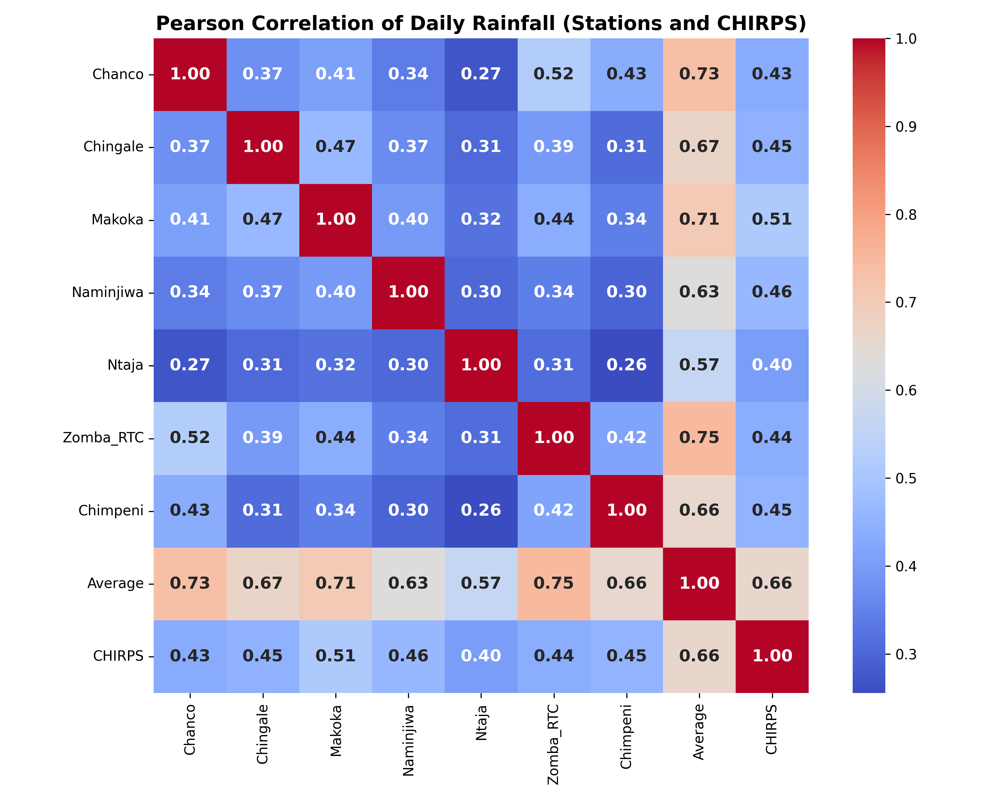

Daily Rainfall Correlations:
              Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.374648  0.408954   0.336921  0.271656   0.524210   
Chingale   0.374648  1.000000  0.466715   0.368770  0.305590   0.394975   
Makoka     0.408954  0.466715  1.000000   0.395757  0.319405   0.436643   
Naminjiwa  0.336921  0.368770  0.395757   1.000000  0.302334   0.343091   
Ntaja      0.271656  0.305590  0.319405   0.302334  1.000000   0.312020   
Zomba_RTC  0.524210  0.394975  0.436643   0.343091  0.312020   1.000000   
Chimpeni   0.434219  0.309117  0.344382   0.297497  0.255343   0.415972   
Average    0.734019  0.669372  0.706138   0.631908  0.566108   0.745502   
CHIRPS     0.431779  0.445886  0.513905   0.462627  0.402142   0.436660   

           Chimpeni   Average    CHIRPS  
Chanco     0.434219  0.734019  0.431779  
Chingale   0.309117  0.669372  0.445886  
Makoka     0.344382  0.706138  0.513905  
Naminjiwa  0.297497  0.631908  0.462627  
Ntaja    

In [ ]:
# Daily rainfall correlation
print('\nComputing daily rainfall correlations...')
daily_rainfall_corr = data_daily[rainfall_cols].corr(method='pearson')
daily_rainfall_corr.to_excel(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Correlations.xlsx'), engine='xlsxwriter')
plt.figure(figsize=(10, 8))
sns.heatmap(daily_rainfall_corr, annot=True, fmt='.2f', cmap='coolwarm', square=True, annot_kws={'size': 12, 'weight': 'bold'})
plt.title('Pearson Correlation of Daily Rainfall (Stations and CHIRPS)', fontsize=14, weight='bold')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Correlation.png'), dpi=300)
plt.savefig(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Correlation.jpg'), dpi=300)
display(Image(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Correlation.png')))
plt.close()
print('Daily Rainfall Correlations:\n', daily_rainfall_corr)

## 3. Daily Rainfall Pairplot


Generating daily rainfall pairplot...


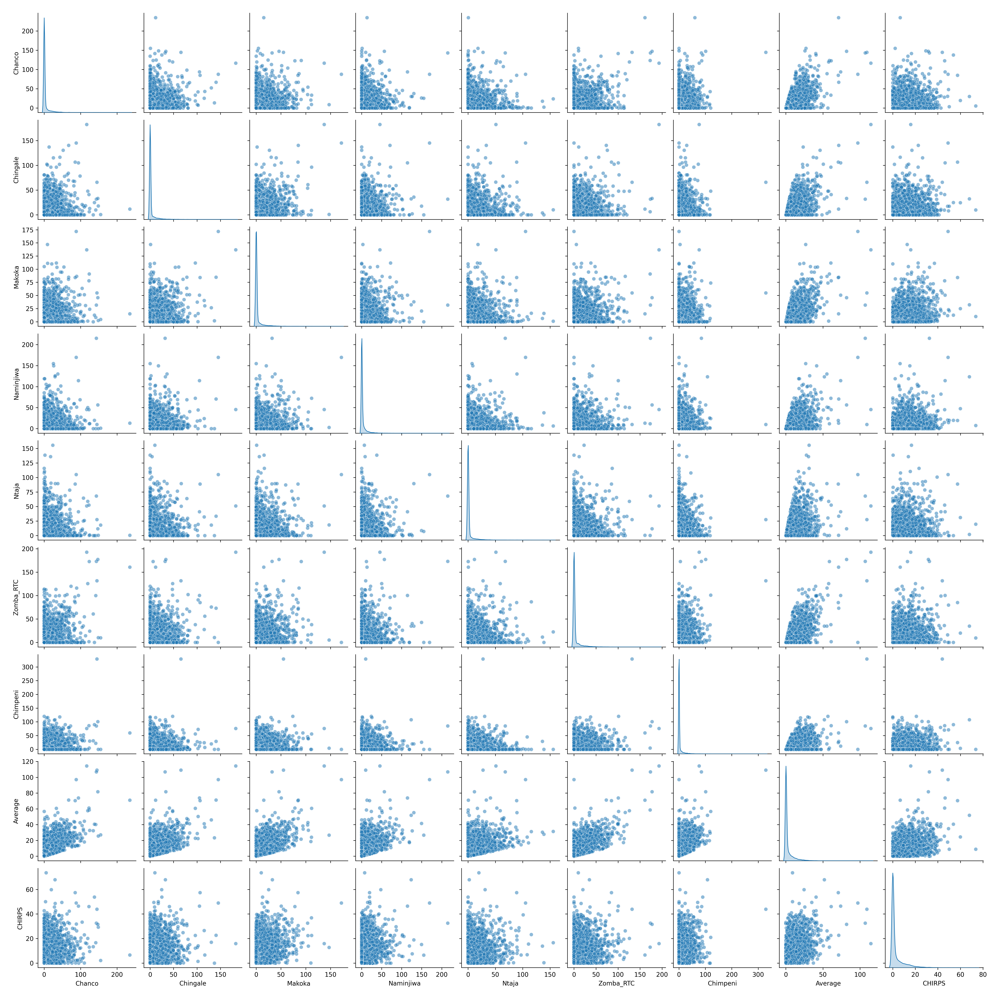

In [ ]:
# Daily rainfall pairplot
print('\nGenerating daily rainfall pairplot...')
sns.pairplot(data_daily[rainfall_cols].dropna(), diag_kind='kde', plot_kws={'alpha': 0.5})
plt.suptitle('Pairplot of Daily Rainfall (Stations and CHIRPS)', fontsize=14, weight='bold', y=1.02)
plt.savefig(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Pairplot.png'), dpi=300)
plt.savefig(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Pairplot.jpg'), dpi=300)
display(Image(os.path.join(output_dir, 'Daily_Rainfall_CHIRPS_Pairplot.png')))
plt.close()

## 4. Analyzing Start and End Dates for Monthly Rainfall Missing Values

In [ ]:
# Analyze start/end dates for monthly rainfall
print('\nAnalyzing monthly rainfall missing values...')
missing_monthly_info = []
station_cols = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni', 'Average']
for col in rainfall_cols:
    if col in station_cols:
        data_subset = data_monthly[(data_monthly.index.year >= 1981) & (data_monthly.index.year <= 2018)]
    else:
        data_subset = data_monthly
    non_null = data_subset[data_subset[col].notna()][col]
    print(f'Non-null months for {col}: {non_null.count()}')
    if not non_null.empty:
        start_date = non_null.index.min().strftime('%Y-%m')
        end_date = non_null.index.max().strftime('%Y-%m')
        years_covered = non_null.index.max().year - non_null.index.min().year + 1
        months_covered = len(non_null.index.to_period('M').unique())
    else:
        start_date = end_date = 'N/A'
        years_covered = months_covered = 0
    missing_monthly_info.append({
        'Column': col,
        'Start Date': start_date,
        'End Date': end_date,
        'Years Covered': years_covered,
        'Months Covered': months_covered
    })
missing_monthly_df = pd.DataFrame(missing_monthly_info)
missing_monthly_df.to_excel(os.path.join(output_dir, 'Monthly_Rainfall_Missing_Dates.xlsx'), index=False, engine='xlsxwriter')
print('Monthly Rainfall Missing Dates:\n', missing_monthly_df)


Analyzing monthly rainfall missing values...
Non-null months for Chanco: 456
Non-null months for Chingale: 456
Non-null months for Makoka: 456
Non-null months for Naminjiwa: 456
Non-null months for Ntaja: 456
Non-null months for Zomba_RTC: 456
Non-null months for Chimpeni: 456
Non-null months for Average: 456
Non-null months for CHIRPS: 536
Monthly Rainfall Missing Dates:
       Column Start Date End Date  Years Covered  Months Covered
0     Chanco    1981-01  2018-12             38             456
1   Chingale    1981-01  2018-12             38             456
2     Makoka    1981-01  2018-12             38             456
3  Naminjiwa    1981-01  2018-12             38             456
4      Ntaja    1981-01  2018-12             38             456
5  Zomba_RTC    1981-01  2018-12             38             456
6   Chimpeni    1981-01  2018-12             38             456
7    Average    1981-01  2018-12             38             456
8     CHIRPS    1981-01  2025-08             45

## 5. Monthly Rainfall Correlation (Common Period)


Computing monthly rainfall correlations (common period)...


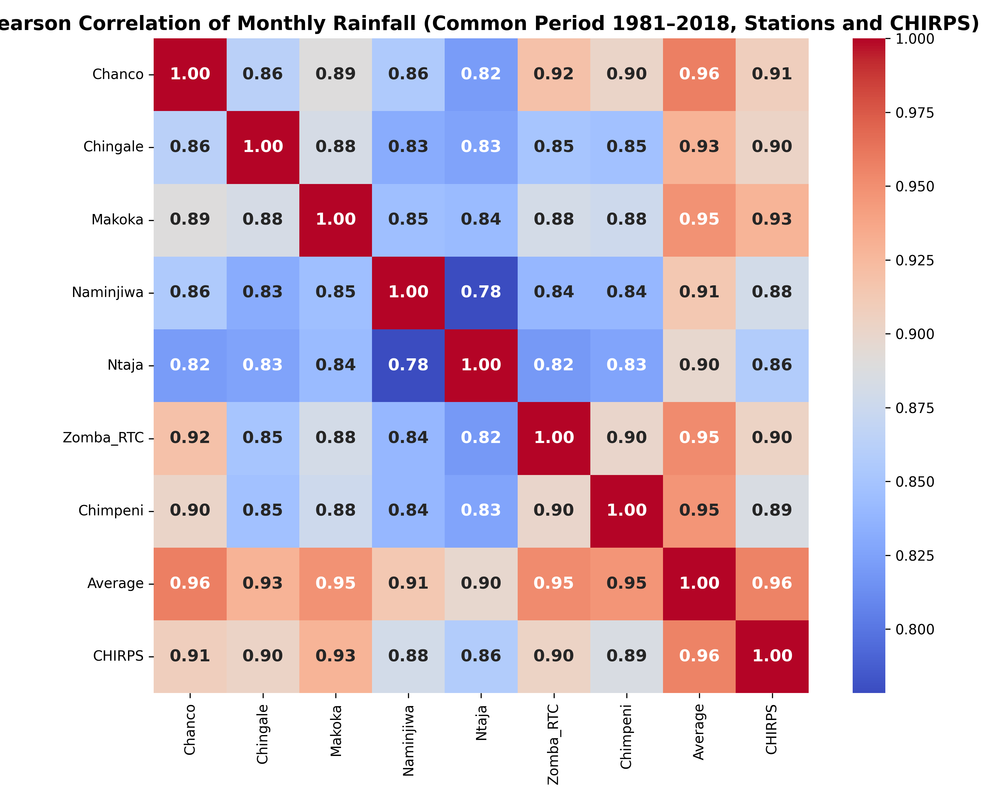

Monthly Rainfall Correlations (Common Period):
              Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.862823  0.889892   0.855942  0.820837   0.919344   
Chingale   0.862823  1.000000  0.882234   0.831510  0.825252   0.850881   
Makoka     0.889892  0.882234  1.000000   0.845412  0.842180   0.880784   
Naminjiwa  0.855942  0.831510  0.845412   1.000000  0.778304   0.839018   
Ntaja      0.820837  0.825252  0.842180   0.778304  1.000000   0.819190   
Zomba_RTC  0.919344  0.850881  0.880784   0.839018  0.819190   1.000000   
Chimpeni   0.901609  0.847407  0.876281   0.839377  0.826468   0.899990   
Average    0.958045  0.929192  0.948355   0.913779  0.898252   0.952228   
CHIRPS     0.907817  0.902476  0.928524   0.879992  0.857286   0.903494   

           Chimpeni   Average    CHIRPS  
Chanco     0.901609  0.958045  0.907817  
Chingale   0.847407  0.929192  0.902476  
Makoka     0.876281  0.948355  0.928524  
Naminjiwa  0.839377  0.913779  0.

In [ ]:
# Monthly rainfall correlation for common period (1981–2018)
print('\nComputing monthly rainfall correlations (common period)...')
common_period = data_monthly[(data_monthly.index.year >= 1981) & (data_monthly.index.year <= 2018)]
common_period = common_period[rainfall_cols][common_period[rainfall_cols[:-1]].notna().all(axis=1) & common_period['CHIRPS'].notna()]
monthly_rainfall_corr = common_period.corr(method='pearson')
monthly_rainfall_corr.to_excel(os.path.join(output_dir, 'Monthly_Rainfall_CHIRPS_Correlations.xlsx'), engine='xlsxwriter')
plt.figure(figsize=(10, 8))
sns.heatmap(monthly_rainfall_corr, annot=True, fmt='.2f', cmap='coolwarm', square=True, annot_kws={'size': 12, 'weight': 'bold'})
plt.title('Pearson Correlation of Monthly Rainfall (Common Period 1981–2018, Stations and CHIRPS)', fontsize=14, weight='bold')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Monthly_Rainfall_CHIRPS_Correlation.png'), dpi=300)
plt.savefig(os.path.join(output_dir, 'Monthly_Rainfall_CHIRPS_Correlation.jpg'), dpi=300)
display(Image(os.path.join(output_dir, 'Monthly_Rainfall_CHIRPS_Correlation.png')))
plt.close()
print('Monthly Rainfall Correlations (Common Period):\n', monthly_rainfall_corr)
print(f'Common Period Range: {common_period.index.min().strftime("%Y-%m")} to {common_period.index.max().strftime("%Y-%m")}')

## 6. Monthly Rainfall Average Statistics

In [ ]:
# Monthly rainfall statistics for station Average
print('\nComputing monthly rainfall statistics (Station Average)...')
monthly_stats = data_monthly[data_monthly['Average'].notna() & (data_monthly['Average'] != 0)].groupby('Month')['Average'].agg(['mean', 'max', 'min', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])
monthly_stats.columns = ['Mean', 'Max', 'Min', '25th Percentile', '75th Percentile']
monthly_stats.index = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
monthly_stats.to_excel(os.path.join(output_dir, 'Monthly_Rainfall_Statistics.xlsx'), engine='xlsxwriter')
print('Monthly Rainfall Statistics:\n', monthly_stats)


Computing monthly rainfall statistics (Station Average)...
Monthly Rainfall Statistics:
                  Mean         Max         Min  25th Percentile  \
January    280.631346  610.571429  110.950000       215.964286   
February   218.278143  421.600000   35.764286       136.935714   
March      157.563589  364.935714   18.100000        98.500000   
April       48.222669  161.157143    9.585714        23.019643   
May          8.098045   28.342857    0.200000         2.817857   
June         3.776486   10.371429    0.285714         1.500000   
July         5.104185   29.800000    0.114286         1.371429   
August       3.326095   13.757143    0.042857         1.007143   
September    3.490336   21.514286    0.028571         0.764286   
October     19.727820   65.542857    1.328571         6.846429   
November    70.142195  222.500000   18.200000        53.167857   
December   206.017684  363.028571   98.328571       163.446429   

           75th Percentile  
January         343.20

## 7. Categorize Years of Wet/Dry/Normal (Station Average)


Categorizing yearly rainfall (Station Average)...
Average years between Extreme Dry transitions: 8.00 years
Years with rainfall falling into the 'Extreme Dry' category (10th percentile or higher, threshold: 715.45 mm): ['1992', '1994', '1995', '2016']
Average years between Dry transitions: 7.40 years
Years with rainfall falling into the 'Dry' category (25th percentile or higher, threshold: 868.18 mm): ['1981', '1983', '1990', '2005', '2012', '2018']
Average years between Normal transitions: 2.06 years
Years with rainfall falling into the 'Normal' category (75th percentile or higher, threshold: 1199.1 mm): ['1982', '1984', '1987', '1993', '1996', '1998', '1999', '2000', '2001', '2002', '2003', '2008', '2009', '2010', '2011', '2013', '2014', '2017']
Average years between Wet transitions: 5.80 years
Years with rainfall falling into the 'Wet' category (90th percentile or higher, threshold: 1307.02 mm): ['1986', '1988', '1991', '2004', '2007', '2015']
Average years between Extreme Wet tran

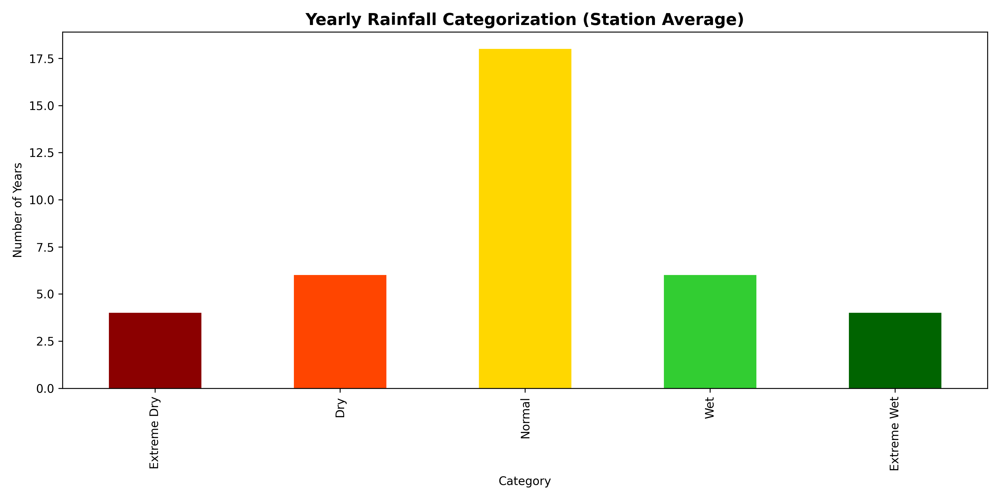

In [ ]:
# Yearly rainfall categorization
print('\nCategorizing yearly rainfall (Station Average)...')
annual_rainfall = data_monthly[(data_monthly.index.year >= 1981) & (data_monthly.index.year <= 2018) & data_monthly['Average'].notna() & (data_monthly['Average'] != 0)].groupby('Year')['Average'].sum()
thresholds = annual_rainfall.quantile([0.1, 0.25, 0.75, 0.9])

def categorize_rainfall(value):
    if pd.isna(value) or value == 0:
        return 'Missing'
    elif value < thresholds[0.1]:
        return 'Extreme Dry'
    elif value < thresholds[0.25]:
        return 'Dry'
    elif value < thresholds[0.75]:
        return 'Normal'
    elif value < thresholds[0.9]:
        return 'Wet'
    else:
        return 'Extreme Wet'

annual_rainfall_df = pd.DataFrame({'Year': annual_rainfall.index, 'Total Rainfall': annual_rainfall.values})
annual_rainfall_df['Category'] = annual_rainfall_df['Total Rainfall'].apply(categorize_rainfall)

# Calculate average years between transitions
categories = ['Extreme Dry', 'Dry', 'Normal', 'Wet', 'Extreme Wet']
transition_gaps = {}
for cat in categories:
    years = annual_rainfall_df[annual_rainfall_df['Category'] == cat]['Year'].values
    if len(years) > 1:
        gaps = [years[i+1] - years[i] for i in range(len(years)-1)]
        transition_gaps[cat] = sum(gaps) / len(gaps) if gaps else 0
    else:
        transition_gaps[cat] = 0

# Print results
for cat in categories:
    years = annual_rainfall_df[annual_rainfall_df['Category'] == cat]['Year'].astype(str).tolist()
    threshold = thresholds[0.1 if cat == 'Extreme Dry' else 0.25 if cat == 'Dry' else 0.75 if cat == 'Normal' else 0.9 if cat == 'Wet' else 0.9].round(2)
    print(f"Average years between {cat} transitions: {transition_gaps[cat]:.2f} years")
    print(f"Years with rainfall falling into the '{cat}' category ({'10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th' if cat == 'Wet' else '90th'} percentile or higher, threshold: {threshold} mm): {years}")
print('Years and Categories:\n', annual_rainfall_df[['Year', 'Category']])

# Save to Excel
annual_rainfall_df.to_excel(os.path.join(output_dir, 'Annual_Rainfall_Categorization.xlsx'), index=False, engine='xlsxwriter')

# Plot
plt.figure(figsize=(12, 6))
annual_rainfall_df.set_index('Year')['Category'].value_counts().reindex(categories).plot(kind='bar', color=['#8B0000', '#FF4500', '#FFD700', '#32CD32', '#006400'])
plt.xlabel('Category')
plt.ylabel('Number of Years')
plt.title('Yearly Rainfall Categorization (Station Average)', fontsize=14, weight='bold')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Annual_Rainfall_Categorization.png'), dpi=300)
plt.savefig(os.path.join(output_dir, 'Annual_Rainfall_Categorization.jpg'), dpi=300)
display(Image(os.path.join(output_dir, 'Annual_Rainfall_Categorization.png')))
plt.close()

## 8. Categorize Agroclimatic Years of Wet/Dry/Normal (Station Average and CHIRPS)


Categorizing agroclimatic yearly rainfall...
Station Average:
Average years between Extreme Dry transitions: 7.40 years
Years with rainfall falling into the 'Extreme Dry' category (10th percentile or higher, threshold: 695.01 mm): ['1980-1981', '1991-1992', '1993-1994', '1994-1995', '2015-2016', '2017-2018']
Average years between Dry transitions: 14.50 years
Years with rainfall falling into the 'Dry' category (25th percentile or higher, threshold: 879.86 mm): ['1982-1983', '1999-2000', '2011-2012']
Average years between Normal transitions: 1.75 years
Years with rainfall falling into the 'Normal' category (75th percentile or higher, threshold: 1167.18 mm): ['1981-1982', '1983-1984', '1986-1987', '1987-1988', '1989-1990', '1990-1991', '1992-1993', '1995-1996', '1997-1998', '1998-1999', '2001-2002', '2002-2003', '2003-2004', '2004-2005', '2007-2008', '2008-2009', '2009-2010', '2010-2011', '2012-2013', '2013-2014', '2016-2017']
Average years between Wet transitions: 10.00 years
Years with

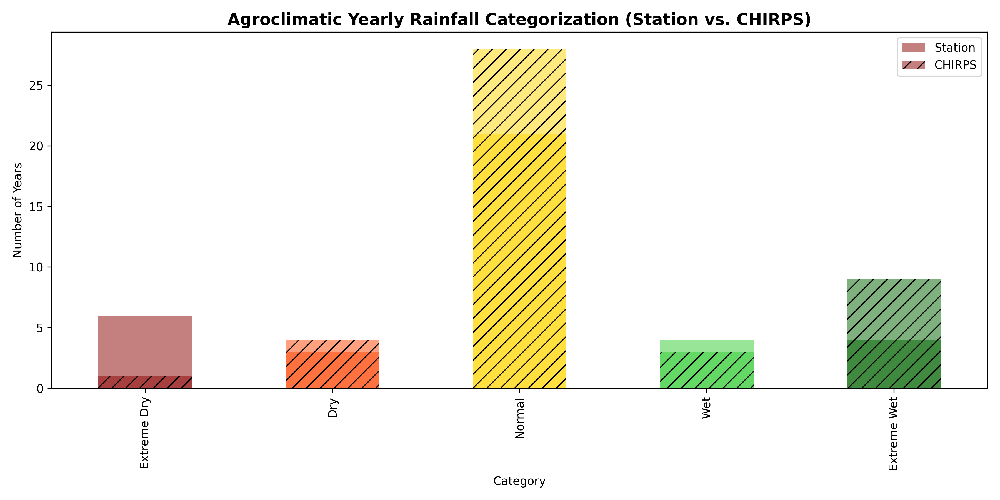

In [ ]:
# Agroclimatic yearly rainfall categorization
print('\nCategorizing agroclimatic yearly rainfall...')

# Aggregate daily CHIRPS to monthly
filtered_daily = data_daily[data_daily['CHIRPS'].notna() & (data_daily['CHIRPS'] != 0)]
chirps_monthly = filtered_daily.groupby([filtered_daily.index.year.rename('Year'), filtered_daily.index.month.rename('Month')])['CHIRPS'].sum().reset_index()
chirps_monthly['Date'] = pd.to_datetime(chirps_monthly[['Year', 'Month']].assign(DAY=1))
chirps_monthly.set_index('Date', inplace=True)

# Define agroclimatic year (October to September)
def get_agroclimatic_year(date):
    year = date.year if date.month >= 10 else date.year - 1
    return f'{year}-{year+1}'

# Station Average
data_monthly['Agroclimatic Year'] = data_monthly.index.map(get_agroclimatic_year)
agro_rainfall_station = data_monthly[
    (data_monthly.index >= '1981-01-01') &
    (data_monthly.index <= '2018-09-30') &
    data_monthly['Average'].notna() &
    (data_monthly['Average'] != 0)
].groupby('Agroclimatic Year')['Average'].sum()
thresholds_station = agro_rainfall_station.quantile([0.1, 0.25, 0.75, 0.9])

agro_rainfall_station_df = pd.DataFrame({
    'Agroclimatic Year': agro_rainfall_station.index,
    'Yearly Average': agro_rainfall_station / 12,
    'Total Rainfall': agro_rainfall_station
})
agro_rainfall_station_df['Category'] = agro_rainfall_station_df['Total Rainfall'].apply(categorize_rainfall)

# CHIRPS
chirps_monthly['Agroclimatic Year'] = chirps_monthly.index.map(get_agroclimatic_year)
agro_rainfall_chirps = chirps_monthly.groupby('Agroclimatic Year')['CHIRPS'].sum()
thresholds_chirps = agro_rainfall_chirps.quantile([0.1, 0.25, 0.75, 0.9])

agro_rainfall_chirps_df = pd.DataFrame({
    'Agroclimatic Year': agro_rainfall_chirps.index,
    'Yearly Average': agro_rainfall_chirps / 12,
    'Total Rainfall': agro_rainfall_chirps
})
agro_rainfall_chirps_df['Category'] = agro_rainfall_chirps_df['Total Rainfall'].apply(categorize_rainfall)

# Calculate transitions for Station
transition_gaps_station = {}
for cat in categories:
    years = agro_rainfall_station_df[agro_rainfall_station_df['Category'] == cat]['Agroclimatic Year'].str.split('-').str[0].astype(int).values
    if len(years) > 1:
        gaps = [years[i+1] - years[i] for i in range(len(years)-1)]
        transition_gaps_station[cat] = sum(gaps) / len(gaps) if gaps else 0
    else:
        transition_gaps_station[cat] = 0

# Calculate transitions for CHIRPS
transition_gaps_chirps = {}
for cat in categories:
    years = agro_rainfall_chirps_df[agro_rainfall_chirps_df['Category'] == cat]['Agroclimatic Year'].str.split('-').str[0].astype(int).values
    if len(years) > 1:
        gaps = [years[i+1] - years[i] for i in range(len(years)-1)]
        transition_gaps_chirps[cat] = sum(gaps) / len(gaps) if gaps else 0
    else:
        transition_gaps_chirps[cat] = 0

# Print results
print('Station Average:')
for cat in categories:
    years = agro_rainfall_station_df[agro_rainfall_station_df['Category'] == cat]['Agroclimatic Year'].tolist()
    threshold = thresholds_station[0.1 if cat == 'Extreme Dry' else 0.25 if cat == 'Dry' else 0.75 if cat == 'Normal' else 0.9 if cat == 'Wet' else 0.9].round(2)
    print(f"Average years between {cat} transitions: {transition_gaps_station[cat]:.2f} years")
    print(f"Years with rainfall falling into the '{cat}' category ({'10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th' if cat == 'Wet' else '90th'} percentile or higher, threshold: {threshold} mm): {years}")
print('Station Years and Categories:\n', agro_rainfall_station_df)

print('\nCHIRPS:')
for cat in categories:
    years = agro_rainfall_chirps_df[agro_rainfall_chirps_df['Category'] == cat]['Agroclimatic Year'].tolist()
    threshold = thresholds_chirps[0.1 if cat == 'Extreme Dry' else 0.25 if cat == 'Dry' else 0.75 if cat == 'Normal' else 0.9 if cat == 'Wet' else 0.9].round(2)
    print(f"Average years between {cat} transitions: {transition_gaps_chirps[cat]:.2f} years")
    print(f"Years with rainfall falling into the '{cat}' category ({'10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th' if cat == 'Wet' else '90th'} percentile or higher, threshold: {threshold} mm): {years}")
print('CHIRPS Years and Categories:\n', agro_rainfall_chirps_df)

# Save to Excel
agro_rainfall_station_df.to_excel(os.path.join(output_dir, 'Agroclimatic_Rainfall_Categorization_Station.xlsx'), index=False, engine='xlsxwriter')
agro_rainfall_chirps_df.to_excel(os.path.join(output_dir, 'Agroclimatic_Rainfall_Categorization_CHIRPS.xlsx'), index=False, engine='xlsxwriter')

# Plot
plt.figure(figsize=(12, 6))
agro_rainfall_station_df.set_index('Agroclimatic Year')['Category'].value_counts().reindex(categories).plot(kind='bar', color=['#8B0000', '#FF4500', '#FFD700', '#32CD32', '#006400'], alpha=0.5, label='Station')
agro_rainfall_chirps_df.set_index('Agroclimatic Year')['Category'].value_counts().reindex(categories).plot(kind='bar', color=['#8B0000', '#FF4500', '#FFD700', '#32CD32', '#006400'], alpha=0.5, label='CHIRPS', hatch='//')
plt.xlabel('Category')
plt.ylabel('Number of Years')
plt.title('Agroclimatic Yearly Rainfall Categorization (Station vs. CHIRPS)', fontsize=14, weight='bold')
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Agroclimatic_Rainfall_Categorization.png'), dpi=300)
plt.savefig(os.path.join(output_dir, 'Agroclimatic_Rainfall_Categorization.jpg'), dpi=300)
display(Image(os.path.join(output_dir, 'Agroclimatic_Rainfall_Categorization.png')))
plt.close()

## 9. Conclusion on Correlations

Daily rainfall correlations between stations (`Chanco`, `Chingale`, `Makoka`, `Naminjiwa`, `Ntaja`, `Zomba_RTC`, `Chimpeni`, `Average`) ranged from 0.27 to 0.75, with the strongest correlation between `Zomba_RTC` and `Average` (r = 0.75). Correlations with CHIRPS were moderate (r = 0.40–0.66, highest for `Average` vs. CHIRPS at r = 0.66), reflecting satellite data variability. Monthly correlations for the common period (1981–2018) were stronger, ranging from 0.78 to 0.96 for stations (highest for `Chanco` vs. `Average`, r = 0.96) and 0.86–0.96 for CHIRPS (highest for `Average` vs. CHIRPS, r = 0.96). These correlations validate CHIRPS for extending rainfall records beyond 2018, despite moderate agreement in extreme years.

In [ ]:
# Save analysis description
description = '''
Lake Chilwa Basin Rainfall Analysis (1981–2025)

1. Daily Missing Values:
- Analyzed start/end dates for missing values in daily rainfall (`Chanco`, `Chingale`, `Makoka`, `Naminjiwa`, `Ntaja`, `Zomba_RTC`, `Chimpeni`, `Average`, `CHIRPS`).
- Saved to 'Daily_Rainfall_Missing_Dates.xlsx'.

2. Daily Correlations:
- Computed Pearson correlations for daily rainfall.
- Saved heatmap to 'Daily_Rainfall_CHIRPS_Correlation.png/jpg' and matrix to 'Daily_Rainfall_CHIRPS_Correlations.xlsx'.

3. Daily Pairplot:
- Generated pairplot for daily rainfall.
- Saved to 'Daily_Rainfall_CHIRPS_Pairplot.png/jpg'.

4. Monthly Missing Values:
- Analyzed start/end dates for missing values in monthly rainfall, including zero values, with stations limited to 1981–2018.
- Saved to 'Monthly_Rainfall_Missing_Dates.xlsx'.

5. Monthly Correlations (Common Period):
- Computed Pearson correlations for monthly rainfall (1981–2018).
- Saved heatmap to 'Monthly_Rainfall_CHIRPS_Correlation.png/jpg' and matrix to 'Monthly_Rainfall_CHIRPS_Correlations.xlsx'.

6. Monthly Statistics:
- Computed mean, max, min, 25th/75th percentiles for station Average rainfall per month, excluding zeros.
- Saved to 'Monthly_Rainfall_Statistics.xlsx'.

7. Yearly Categorization:
- Categorized years as Extreme Dry, Dry, Normal, Wet, Extreme Wet based on station Average, marking 2019–2025 as Missing.
- Saved to 'Annual_Rainfall_Categorization.xlsx' and plotted in 'Annual_Rainfall_Categorization.png/jpg'.

8. Agroclimatic Categorization:
- Categorized agroclimatic years (Oct–Sep) for station Average (1981–2018) and aggregated CHIRPS, marking 2018–2025 as Missing for stations.
- Saved to 'Agroclimatic_Rainfall_Categorization_Station.xlsx' and 'Agroclimatic_Rainfall_Categorization_CHIRPS.xlsx'.
- Plotted in 'Agroclimatic_Rainfall_Categorization.png/jpg'.

9. Conclusion:
- Daily correlations: Stations r = 0.27–0.75, CHIRPS r = 0.40–0.66.
- Monthly correlations: Stations r = 0.78–0.96, CHIRPS r = 0.86–0.96.
- CHIRPS is reliable for extending records beyond 2018.
'''
with open(os.path.join(output_dir, 'Rainfall_Analysis_Description.txt'), 'w') as f:
    f.write(description)

# Upload to Google Drive (destination account)
print('\nUploading results to Google Drive...')
auth.authenticate_user()
drive_service = build('drive', 'v3')

# Find or create the Malawi folder
malawi_folder_query = "name='Malawi' and mimeType='application/vnd.google-apps.folder' and trashed=false"
malawi_folder_results = drive_service.files().list(q=malawi_folder_query, spaces='drive', fields='files(id, name)').execute()
malawi_folders = malawi_folder_results.get('files', [])

if malawi_folders:
    malawi_folder_id = malawi_folders[0]['id']
else:
    malawi_folder_metadata = {'name': 'Malawi', 'mimeType': 'application/vnd.google-apps.folder'}
    malawi_folder = drive_service.files().create(body=malawi_folder_metadata, fields='id').execute()
    malawi_folder_id = malawi_folder.get('id')

# Create output folder inside Malawi
folder_name = f'Rainfall_Analysis_{datetime.datetime.now().strftime("%Y%m%d_%H%M%S")}'
folder_metadata = {'name': folder_name, 'mimeType': 'application/vnd.google-apps.folder', 'parents': [malawi_folder_id]}
folder = drive_service.files().create(body=folder_metadata, fields='id').execute()
folder_id = folder.get('id')

# Upload files to the new folder
for file_name in os.listdir(output_dir):
    file_path = os.path.join(output_dir, file_name)
    if os.path.isfile(file_path):
        file_metadata = {'name': file_name, 'parents': [folder_id]}
        media = MediaFileUpload(file_path, resumable=True)
        file = drive_service.files().create(body=file_metadata, media_body=media, fields='id').execute()
        print(f'Uploaded: {file_name}')


Uploading results to Google Drive...
Uploaded: Annual_Rainfall_Categorization.jpg
Uploaded: Monthly_Rainfall_CHIRPS_Correlation.jpg
Uploaded: Agroclimatic_Rainfall_Categorization_Station.xlsx
Uploaded: Agroclimatic_Rainfall_Categorization.jpg
Uploaded: Monthly_Rainfall_CHIRPS_Correlation.png
Uploaded: Agroclimatic_Rainfall_Categorization.png
Uploaded: Annual_Rainfall_Categorization.png
Uploaded: Daily_Rainfall_CHIRPS_Pairplot.jpg
Uploaded: Agroclimatic_Rainfall_Categorization_CHIRPS.xlsx
Uploaded: Daily_Rainfall_CHIRPS_Correlation.jpg
Uploaded: Monthly_Rainfall_Statistics.xlsx
Uploaded: Daily_Rainfall_CHIRPS_Pairplot.png
Uploaded: Monthly_Rainfall_Missing_Dates.xlsx
Uploaded: Daily_Rainfall_CHIRPS_Correlations.xlsx
Uploaded: Monthly_Rainfall_CHIRPS_Correlations.xlsx
Uploaded: Daily_Rainfall_CHIRPS_Correlation.png
Uploaded: Rainfall_Analysis_Description.txt
Uploaded: Annual_Rainfall_Categorization.xlsx
Uploaded: Daily_Rainfall_Missing_Dates.xlsx


## 10. Display Results as Text

This section displays the contents of all generated Excel files and categorization results (thresholds and transition gaps) as text for easy copying.

In [ ]:
# Display Excel outputs and categorization results as text
print('\nDisplaying Excel outputs and categorization results as text...')

# List of Excel files
excel_files = [
    'Daily_Rainfall_Missing_Dates.xlsx',
    'Daily_Rainfall_CHIRPS_Correlations.xlsx',
    'Monthly_Rainfall_Missing_Dates.xlsx',
    'Monthly_Rainfall_CHIRPS_Correlations.xlsx',
    'Monthly_Rainfall_Statistics.xlsx',
    'Annual_Rainfall_Categorization.xlsx',
    'Agroclimatic_Rainfall_Categorization_Station.xlsx',
    'Agroclimatic_Rainfall_Categorization_CHIRPS.xlsx'
]

# Read and print each Excel file
for file_name in excel_files:
    file_path = os.path.join(output_dir, file_name)
    if os.path.exists(file_path):
        print(f'\nContents of {file_name}:')
        df = pd.read_excel(file_path)
        print(df.to_string(index=False))
    else:
        print(f'\n{file_name} not found.')

# Print categorization thresholds and transition gaps
print('\nYearly Categorization Thresholds (Station Average):')
for cat, quantile in [('Extreme Dry', 0.1), ('Dry', 0.25), ('Normal', 0.75), ('Wet', 0.9), ('Extreme Wet', 0.9)]:
    percentile = '10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th'
    threshold = thresholds[quantile].round(2)
    print(f'{cat} (<{percentile} percentile): {threshold} mm')

print('\nYearly Categorization Transition Gaps (Station Average):')
for cat in categories:
    print(f'Average years between {cat} transitions: {transition_gaps[cat]:.2f} years')

print('\nAgroclimatic Categorization Thresholds (Station Average):')
for cat, quantile in [('Extreme Dry', 0.1), ('Dry', 0.25), ('Normal', 0.75), ('Wet', 0.9), ('Extreme Wet', 0.9)]:
    percentile = '10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th'
    threshold = thresholds_station[quantile].round(2)
    print(f'{cat} (<{percentile} percentile): {threshold} mm')

print('\nAgroclimatic Categorization Transition Gaps (Station Average):')
for cat in categories:
    print(f'Average years between {cat} transitions: {transition_gaps_station[cat]:.2f} years')

print('\nAgroclimatic Categorization Thresholds (CHIRPS):')
for cat, quantile in [('Extreme Dry', 0.1), ('Dry', 0.25), ('Normal', 0.75), ('Wet', 0.9), ('Extreme Wet', 0.9)]:
    percentile = '10th' if cat == 'Extreme Dry' else '25th' if cat == 'Dry' else '75th' if cat == 'Normal' else '90th'
    threshold = thresholds_chirps[quantile].round(2)
    print(f'{cat} (<{percentile} percentile): {threshold} mm')

print('\nAgroclimatic Categorization Transition Gaps (CHIRPS):')
for cat in categories:
    print(f'Average years between {cat} transitions: {transition_gaps_chirps[cat]:.2f} years')


Displaying Excel outputs and categorization results as text...

Contents of Daily_Rainfall_Missing_Dates.xlsx:
   Column Start Date End Date  Years Covered  Months Covered
   Chanco    1981-01  2018-12             38             456
 Chingale    1981-01  2018-12             38             456
   Makoka    1981-01  2018-12             38             456
Naminjiwa    1981-01  2018-12             38             456
    Ntaja    1981-01  2018-12             38             456
Zomba_RTC    1981-01  2018-12             38             456
 Chimpeni    1981-01  2018-12             38             456
  Average    1981-01  2018-12             38             456
   CHIRPS    1981-01  2025-06             45             534

Contents of Daily_Rainfall_CHIRPS_Correlations.xlsx:
Unnamed: 0   Chanco  Chingale   Makoka  Naminjiwa    Ntaja  Zomba_RTC  Chimpeni  Average   CHIRPS
    Chanco 1.000000  0.374648 0.408954   0.336921 0.271656   0.524210  0.434219 0.734019 0.431779
  Chingale 0.374648  1.00000